# Construct The Room Maze Environment

In [1]:
import sys
sys.path.append('../')
from panav.environment.env import Room

from panav.viz import draw_env,draw_hybrid

%load_ext snakeviz
%load_ext autoreload
%autoreload 2

# The Room Maze environment

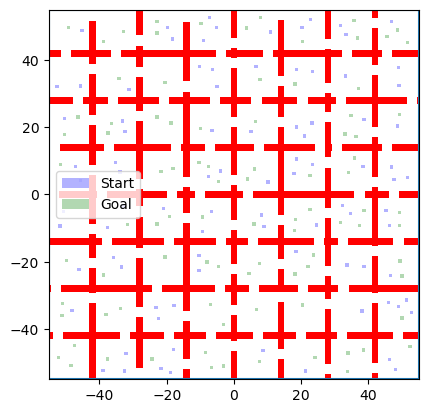

In [2]:
import numpy as np


bloating_r = 0.5
vmax = 1.0

env = Room(N_agent=90)

draw_env(env,obs_alpha=1.0)


In [3]:
from panav.hybrid import HybridGraph
HG = HybridGraph(env,agent_radius=bloating_r,tunnels=env.tunnels)

/Users/tianpengzhang/opt/miniconda3/envs/PA-NAV/lib/python3.11/site-packages/shapely/measurement.py:74: RuntimeWarning: invalid value encountered in distance
  return lib.distance(a, b, **kwargs)
/Users/tianpengzhang/opt/miniconda3/envs/PA-NAV/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


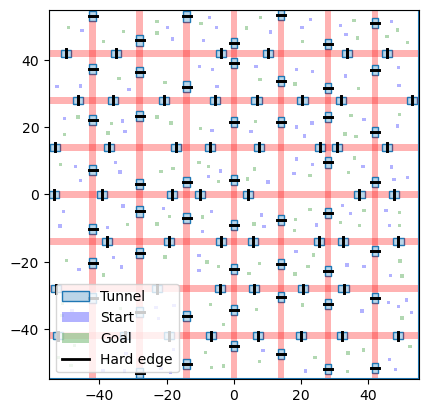

In [4]:
draw_hybrid(HG,display_node=False)

In [5]:
from panav.hybrid import reduced_agents_HG

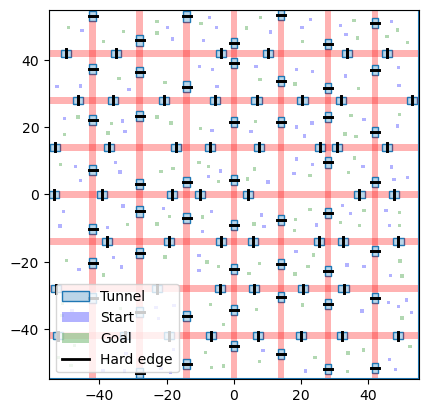

In [12]:
hg = reduced_agents_HG(HG,90)
draw_hybrid(hg,display_node=False)

In [15]:
# %%snakeviz
from panav.PIBT import PIBT_plan

for e in HG.edges:
    if HG.edges[e]['type'] == 'hard':
        HG.edges[e]['occupants'] = set()
        w,v = e
        
        HG.nodes[v]['occupant'] = HG.nodes[w]['occupant'] = None
      
plans = PIBT_plan(hg,vmax,bloating_r,TIMEOUT=100,debug = False,simple_plan=True,exhaustive_search=True)
# plans = TAHP(HG,vmax,bloating_r, TIMEOUT=100)

################# Time step 0 ################
Remaining agents 90
################# Time step 1 ################
Remaining agents 90
################# Time step 2 ################
Remaining agents 90
################# Time step 3 ################
Remaining agents 90
################# Time step 4 ################
Remaining agents 90
################# Time step 5 ################
Remaining agents 90
################# Time step 6 ################
Remaining agents 90
################# Time step 7 ################
Remaining agents 90
################# Time step 8 ################
Remaining agents 90
################# Time step 9 ################
Remaining agents 90
################# Time step 10 ################
Remaining agents 90
################# Time step 11 ################
Remaining agents 90
################# Time step 12 ################
Remaining agents 90
################# Time step 13 ################
Remaining agents 90
################# Time step 14 ################
Remaining 

/Users/tianpengzhang/opt/miniconda3/envs/PA-NAV/lib/python3.11/site-packages/cvxpy/problems/problem.py:1391: UserWarning: 
    The problem is either infeasible or unbounded, but the solver
    cannot tell which. Disable any solver-specific presolve methods
    and re-solve to determine the precise problem status.

    For GUROBI and CPLEX you can automatically perform this re-solve
    with the keyword argument prob.solve(reoptimize=True, ...).
    
  warnings.warn(INF_OR_UNB_MESSAGE)


Potential deadlock 69
Deadlock resolved at theta= 0.7853981633974483
Potential deadlock 82
Deadlock resolved at theta= 0.7853981633974483
################# Time step 62 ################
Remaining agents 86
################# Time step 63 ################
Remaining agents 86
################# Time step 64 ################
Remaining agents 86
Potential deadlock 60
Deadlock resolved at theta= 0.7853981633974483
Potential deadlock 33
Deadlock resolved at theta= 0.7853981633974483
Potential deadlock 66
Deadlock resolved at theta= 0.7853981633974483
################# Time step 65 ################
Remaining agents 86
Potential deadlock 57
Deadlock resolved at theta= 0.7853981633974483
Potential deadlock 69
Deadlock resolved at theta= 0.7853981633974483
Potential deadlock 82
Deadlock resolved at theta= 0.7853981633974483
################# Time step 66 ################
Remaining agents 86
################# Time step 67 ################
Remaining agents 86
################# Time step 68 #########

In [55]:
from matplotlib import pyplot as plt
from panav.viz import animation
from IPython.display import HTML, display
from matplotlib import rcParams

exec_tau = 1.0

rcParams['animation.embed_limit'] = 2**128
dt = exec_tau 
agents = range(len(plans))
pos_to_ani = [np.array(plans[a][1]) for a in agents]
anim = animation(env, pos_to_ani, bloating_r, dt = dt)
display(HTML(anim.to_jshtml()))
plt.close() 